# Restore individual models

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16
import collections
import time
import math

## Load Auto_Encoder_weights

In [2]:
# 5f - 10f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/5to10_add-more-data_lr=0.0001_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au1w1 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_1:0').eval()
    Au1b1 = loaded_graph.get_tensor_by_name('conv_layers/bias_1:0').eval()
    Au1w2 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_2:0').eval()
    Au1b2 = loaded_graph.get_tensor_by_name('conv_layers/bias_2:0').eval()
    Au1w3 = loaded_graph.get_tensor_by_name('conv_layers/conv_weights_3:0').eval()
    Au1b3 = loaded_graph.get_tensor_by_name('conv_layers/bias_3:0').eval()
    Au1deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au1deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/5to10_add-more-data_lr=0.0001_nl=3_bs=80.ckpt


In [3]:
# 10f - 15f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/10to15_add-more-data_lr=0.0002_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au2deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au2deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
    # Val X1
# val_x = gallery_full[2500:, 0]
# val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# # Val Y
# val_y = gallery_full[2500:, 3]
# val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
# print('val_x', val_x.shape, 'valsave_decoded_y', val_y.shape)
# me('deconv_layers/debias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/10to15_add-more-data_lr=0.0002_nl=3_bs=80.ckpt


In [4]:
# 15f - 20f
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/15to20_add_more_data_dg=85_lr=0.0004_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au3deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au3deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
#     Au3deW2 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_2:0').eval()
#     Au3deB2 = loaded_graph.get_tensor_by_name('deconv_layers/debias_2:0').eval()
#     Au3outW = loaded_graph.get_tensor_by_name('output_layer/output_weights:0').eval()
#     Au3outb = loaded_graph.get_tensor_by_name('output_layer/outbias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/15to20_add_more_data_dg=85_lr=0.0004_nl=3_bs=80.ckpt


In [5]:
# 20f - full
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/20tofull_add-more-data_lr=0.0002_nl=3_bs=80.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    Au4deW1 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_1:0').eval()
    Au4deB1 = loaded_graph.get_tensor_by_name('deconv_layers/debias_1:0').eval()
    Au4deW2 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_2:0').eval()
    Au4deB2 = loaded_graph.get_tensor_by_name('deconv_layers/debias_2:0').eval()
    Au4deW3 = loaded_graph.get_tensor_by_name('deconv_layers/deconv_weights_3:0').eval()
    Au4deB3 = loaded_graph.get_tensor_by_name('deconv_layers/debias_3:0').eval()
    Au4outW = loaded_graph.get_tensor_by_name('output_layer/output_weights:0').eval()
    Au4outB = loaded_graph.get_tensor_by_name('output_layer/outbias_1:0').eval()

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/20tofull_add-more-data_lr=0.0002_nl=3_bs=80.ckpt


In [6]:
Au4deW2.shape

(4, 4, 16, 32)

In [7]:
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

# 5f
gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))

gallery_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq00', mode='rb'))
probe_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq01', mode='rb'))

gallery_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq00', mode='rb'))
probe_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq01', mode='rb'))

gallery_5f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_4_Seq00', mode='rb'))
probe_5f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_4_Seq01', mode='rb'))

# gallery_5f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_5_Seq00', mode='rb'))
# probe_5f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_5_Seq01', mode='rb'))

# gallery_5f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_6_Seq00', mode='rb'))
# probe_5f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_6_Seq01', mode='rb'))

gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)

gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)

gallery_5f_2 = gallery_5f_2/float(255)
probe_5f_2 = probe_5f_2/float(255)

gallery_5f_3 = gallery_5f_3/float(255)
probe_5f_3 = probe_5f_3/float(255)

gallery_5f_4 = gallery_5f_4/float(255)
probe_5f_4 = probe_5f_4/float(255)

# gallery_5f_5 = gallery_5f_5/float(255)
# probe_5f_5 = probe_5f_5/float(255)

# gallery_5f_6 = gallery_5f_6/float(255)
# probe_5f_6 = probe_5f_6/float(255)

# 10f 
gallery_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq00', mode='rb'))
probe_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq01', mode='rb'))

gallery_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq00', mode='rb'))
probe_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq01', mode='rb'))

gallery_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq00', mode='rb'))
probe_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq01', mode='rb'))

gallery_10f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_4_Seq00', mode='rb'))
probe_10f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_4_Seq01', mode='rb'))

# gallery_10f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_5_Seq00', mode='rb'))
# probe_10f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_5_Seq01', mode='rb'))

# gallery_10f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_6_Seq00', mode='rb'))
# probe_10f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_6_Seq01', mode='rb'))

gallery_10f = gallery_10f/float(255)
probe_10f = probe_10f/float(255)

gallery_10f_2 = gallery_10f_2/float(255)
probe_10f_2 = probe_10f_2/float(255)

gallery_10f_3 = gallery_10f_3/float(255)
probe_10f_3 = probe_10f_3/float(255)

gallery_10f_4 = gallery_10f_4/float(255)
probe_10f_4 = probe_10f_4/float(255)

# gallery_10f_5 = gallery_10f_5/float(255)
# probe_10f_5 = probe_10f_5/float(255)

# gallery_10f_6 = gallery_10f_6/float(255)
# probe_10f_6 = probe_10f_6/float(255)

# 15f 
gallery_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq00', mode='rb'))
probe_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq01', mode='rb'))

gallery_15f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_2_Seq00', mode='rb'))
probe_15f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_2_Seq01', mode='rb'))

gallery_15f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_3_Seq00', mode='rb'))
probe_15f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_3_Seq01', mode='rb'))

gallery_15f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_4_Seq00', mode='rb'))
probe_15f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_4_Seq01', mode='rb'))

# gallery_15f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_5_Seq00', mode='rb'))
# probe_15f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_5_Seq01', mode='rb'))

# gallery_15f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_6_Seq00', mode='rb'))
# probe_15f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_6_Seq01', mode='rb'))

gallery_15f = gallery_15f/float(255)
probe_15f = probe_15f/float(255)

gallery_15f_2 = gallery_15f_2/float(255)
probe_15f_2 = probe_15f_2/float(255)

gallery_15f_3 = gallery_15f_3/float(255)
probe_15f_3 = probe_15f_3/float(255)

gallery_15f_4 = gallery_15f_4/float(255)
probe_15f_4 = probe_15f_4/float(255)

# gallery_15f_5 = gallery_15f_5/float(255)
# probe_15f_5 = probe_15f_5/float(255)

# gallery_15f_6 = gallery_15f_6/float(255)
# probe_15f_6 = probe_15f_6/float(255)

# 20f 
gallery_20f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_Seq00', mode='rb'))
probe_20f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_Seq01', mode='rb'))

gallery_20f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_2_Seq00', mode='rb'))
probe_20f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_2_Seq01', mode='rb'))

gallery_20f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_3_Seq00', mode='rb'))
probe_20f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_3_Seq01', mode='rb'))

gallery_20f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_4_Seq00', mode='rb'))
probe_20f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_4_Seq01', mode='rb'))

# gallery_20f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_5_Seq00', mode='rb'))
# probe_20f_5 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_5_Seq01', mode='rb'))

# gallery_20f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_6_Seq00', mode='rb'))
# probe_20f_6 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_20f_6_Seq01', mode='rb'))

gallery_20f = gallery_20f/float(255)
probe_20f = probe_20f/float(255)

gallery_20f_2 = gallery_20f_2/float(255)
probe_20f_2 = probe_20f_2/float(255)

gallery_20f_3 = gallery_20f_3/float(255)
probe_20f_3 = probe_20f_3/float(255)

gallery_20f_4 = gallery_20f_4/float(255)
probe_20f_4 = probe_20f_4/float(255)

# gallery_20f_5 = gallery_20f_5/float(255)
# probe_20f_5 = probe_20f_5/float(255)

# gallery_20f_6 = gallery_20f_6/float(255)
# probe_20f_6 = probe_20f_6/float(255)

In [8]:
# Train X
train_x = np.concatenate([gallery_5f[:2146, 3], probe_5f[:2146, 3], gallery_5f_2[:2146, 3], 
                          probe_5f_2[:2146, 3], gallery_5f_3[:2146, 3], probe_5f_3[:2146, 3],
                          gallery_5f_4[:2146, 3], probe_5f_4[:2146, 3]], gallery_5f_3[:2146, 3], probe_5f_3[:2146, 3]axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_full[:2146, 3], probe_full[:2146, 3], gallery_full[:2146, 3], 
                          probe_full[:2146, 3], gallery_full[:2146, 3], probe_full[:2146, 3]], axis=0)
train_y = np.reshape(train_y, [train_y.shape[0], train_y.shape[1], train_y.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = np.concatenate([gallery_5f[2146:2646, 3], probe_5f[2146:2646, 3], gallery_5f_2[2146:2646, 3], 
                        probe_5f_2[2146:2646, 3], gallery_5f_3[2146:2646, 3], probe_5f_3[2146:2646, 3]], axis=0)
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = np.concatenate([gallery_full[2146:2646, 3], probe_full[2146:2646, 3], gallery_full[2146:2646, 3], 
                        probe_full[2146:2646, 3], gallery_full[2146:2646, 3], probe_full[2146:2646, 3]], axis=0)
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = np.concatenate([gallery_5f[2646:, 3], probe_5f[2646:, 3], gallery_5f_2[2646:, 3], 
                         probe_5f_2[2646:, 3], gallery_5f_3[2646:, 3],probe_5f_3[2646:, 3]], axis=0)
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = np.concatenate([gallery_full[2646:, 3], probe_full[2646:, 3], gallery_full[2646:, 3], 
                         probe_full[2646:, 3], gallery_full[2646:, 3], probe_full[2646:, 3]], axis=0)
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (12876, 64, 64, 1) train_y (12876, 64, 64, 1)
val_x (3000, 64, 64, 1) val_y (3000, 64, 64, 1)
test_x (3000, 64, 64, 1) test_y (3000, 64, 64, 1)


## Build End to End

In [9]:
def conv_layer(inputs_, weight, weight_name, bias, bias_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True,
               out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
    
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # filter:[filter_height, filter_width, in_channels, out_channels]
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, Weights, stride, padding='SAME', name=conv_name), Bias)
            
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)
                    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
save_decoded
    return conv2d

def deconv_layer(encoded, up_name, weight, weight_name, bias, bias_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True,
                 up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, Weights, stride, padding='SAME', name=de_conv_name),\
                   Bias)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)

    return conv2d

def output_layer(conv2d, weight, weight_name, bias, bias_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # Weights
    Weights = tf.Variable(weight, name=weight_name)
    
    # Bias
    Bias = tf.Variable(bias, name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, Weights, stride, padding='SAME', name=logits_name),\
                   Bias)
    
#     if add_batch_norm:
#         conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [18]:
conv_kern_size = (4,4)
conv_strides = (1,1)
pool_size = (2,2)
pool_strides = (2,2)
up_size = [(16,16), (32,32), (64,64)]
de_kern_size = (4,4)
de_conv_strides = (1,1)
out_kern_size = (4,4)
out_strides = (1,1)


g = tf.Graph()
tf.reset_default_graph()
with g.as_default():
    
    Au1_Weights_1 = tf.convert_to_tensor(Au1w1, dtype=tf.float32)
    Au1_Bias_1 = tf.convert_to_tensor(Au1b1, dtype=tf.float32)
    Au1_Weights_2 = tf.convert_to_tensor(Au1w2, dtype=tf.float32)
    Au1_Bias_2 = tf.convert_to_tensor(Au1b2, dtype=tf.float32)
    Au1_Weights_3 = tf.convert_to_tensor(Au1w3, dtype=tf.float32)
    Au1_Bias_3 = tf.convert_to_tensor(Au1b3, dtype=tf.float32)
    Au1_deWeights_1 = tf.convert_to_tensor(Au1deW1, dtype=tf.float32)
    Au1_deBias_1 = tf.convert_to_tensor(Au1deB1, dtype=tf.float32)
    
    Au2_deWeights_1 = tf.convert_to_tensor(Au2deW1, dtype=tf.float32)
    Au2_deBias_1 = tf.convert_to_tensor(Au2deB1, dtype=tf.float32)
    
    Au3_deWeights_1 = tf.convert_to_tensor(Au3deW1, dtype=tf.float32)
    Au3_deBias_1 = tf.convert_to_tensor(Au3deB1, dtype=tf.float32)
    
    Au4_deWeights_1 = tf.convert_to_tensor(Au4deW1, dtype=tf.float32)
    Au4_deBias_1 = tf.convert_to_tensor(Au4deB1, dtype=tf.float32)
    Au4_deWeights_2 = tf.convert_to_tensor(Au4deW2, dtype=tf.float32)
    Au4_deBias_2 = tf.convert_to_tensor(Au4deB2, dtype=tf.float32)
    Au4_deWeights_3 = tf.convert_to_tensor(Au4deW3, dtype=tf.float32)
    Au4_deBias_3 = tf.convert_to_tensor(Au4deB3, dtype=tf.float32)
    Au4_outWeights = tf.convert_to_tensor(Au4outW, dtype=tf.float32)
    Au4_outBias = tf.convert_to_tensor(Au4outB, dtype=tf.float32)
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    training = tf.placeholder(tf.bool, name='training')
    inputs = tf.placeholder(tf.float32, [None, 64, 64, 1], name='inputs')
    targets = tf.placeholder(tf.float32, [None, 64, 64, 1], name='targets')

    # 128x88 -- 16x11
    with tf.name_scope('conv_layer'):
        # outdim 1 -- 32
        maxpool_1 = conv_layer(inputs, Au1_Weights_1, 'weight_1', Au1_Bias_1, 'bias_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=training, out_dim=64, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, Au1_Weights_2, 'weight_2', Au1_Bias_2, 'bias_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=training, out_dim=32, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, Au1_Weights_3, 'weight_3', Au1_Bias_3, 'bias_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=training, out_dim=16, conv_kernsize=conv_kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
    with tf.name_scope('hidden_layers'):
        # outdim 8 -- 8
        stride = [1, conv_strides[0], conv_strides[1], 1]
        
        # 5f - 10f 16x11x8 -- 16x11x8
        Au1deWeights1 = tf.Variable(Au1_deWeights_1, name='h_weight_1')
        Au1deBias1 = tf.Variable(Au1_deBias_1, name='h_bias_1')
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(maxpool_3, Au1deWeights1, stride, padding='SAME', name='hidden_1'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1')
        
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au1deWeights1, stride, padding='SAME', name='hidden_1_1'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1_1')
        
        conv_hidden_1 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au1deWeights1, stride, padding='SAME', name='hidden_1_2'), Au1deBias1)
        conv_hidden_1 = tf.layers.batch_normalization(conv_hidden_1, training=training, name='h_bn_1_2')
        
        # 10f - 15f 16x11x8 -- 16x11x8
        Au2deWeights1 = tf.Variable(Au2_deWeights_1, name='h_weight_2')
        Au2deBias1 = tf.Variable(Au2_deBias_1, name='h_bias_2')
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_1, Au2deWeights1, stride, padding='SAME', name='hidden_2'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2')
        
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au2deWeights1, stride, padding='SAME', name='hidden_2_1'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2_1')
        
        conv_hidden_2 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au2deWeights1, stride, padding='SAME', name='hidden_2_2'), Au2deBias1)
        conv_hidden_2 = tf.layers.batch_normalization(conv_hidden_2, training=training, name='h_bn_2_2')

        # 15f - 20f 16x11x8 -- 16x11x8
        Au3deWeights1 = tf.Variable(Au3_deWeights_1, name='h_weight_3')
        Au3deBias1 = tf.Variable(Au3_deBias_1, name='h_bias_3')
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_2, Au3deWeights1, stride, padding='SAME', name='hidden_3'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3')
        
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au3deWeights1, stride, padding='SAME', name='hidden_3_1'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3_1')
    
        conv_hidden_3 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au3deWeights1, stride, padding='SAME', name='hidden_3_2'), Au3deBias1)
        conv_hidden_3 = tf.layers.batch_normalization(conv_hidden_3, training=training, name='h_bn_3_2')

        # 20f - full 16x11x8 -- 16x11x8
        Au4deWeights1 = tf.Variable(Au4_deWeights_1, name='h_weight_4')
        Au4deBias1 = tf.Variable(Au4_deBias_1, name='h_bias_4')
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_3, Au4deWeights1, stride, padding='SAME', name='hidden_4'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4')
        
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_4, Au4deWeights1, stride, padding='SAME', name='hidden_4_1'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4_1')
        
        conv_hidden_4 = tf.nn.bias_add(tf.nn.conv2d(conv_hidden_4, Au4deWeights1, stride, padding='SAME', name='hidden_4_2'), Au4deBias1)
        conv_hidden_4 = tf.layers.batch_normalization(conv_hidden_4, training=training, name='h_bn_4_2')

    with tf.name_scope('deconv_layers'):
        # outdim 8 -- 16
        deconv_1 = deconv_layer(conv_hidden_4, 'up_1', Au4_deWeights_1, 'deWeight_1', Au4_deBias_1, 'deBias_1', 'deconv_1', 'debn_1', 'derelu_1', add_batch_norm=True, is_training=training,
                     up_size=up_size[0], out_dim=16, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', Au4_deWeights_2, 'deWeight_2', Au4_deBias_2, 'deBias_2', 'deconv_2', 'debn_2', 'derelu_2', add_batch_norm=True, is_training=training,
                     up_size=up_size[1], out_dim=32, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', Au4_deWeights_3, 'deWeight_3', Au4_deBias_3, 'deBias_3', 'deconv_3', 'debn_3', 'derelu_3', add_batch_norm=True, is_training=training,
                     up_size=up_size[2], out_dim=64, conv_kernsize=de_kern_size, conv_strides=de_conv_strides, keep_prob=keep_p)

    with tf.name_scope('output_layer'):
        # outdim 32 -- 1
        logits, decoded = output_layer(deconv_3, Au4_outWeights, 'outWeight', Au4_outBias, 'outBias', 'logits', 'outbn', 'output', add_batch_norm=True, is_training=training, 
                                       out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)

    # Now 64x64x1 Output
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
    
    MSE = tf.reduce_mean(tf.losses.mean_squared_error(targets, decoded), name='MSE')
#     loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets, logits=logits, name='loss')
#     cost = tf.reduce_mean(loss, name='cost')
    opt = tf.train.AdamOptimizer(learning_rate).minimize(MSE)

    with tf.name_scope('saver'):
        saver = tf.train.Saver()

In [19]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

Epoch: 1/3000,  Iteration: 25,  Train loss: 0.299,       0.0s /batch.  Train Accuracy: %73.475

Validation loss: 0.267,  Validation MSE: 0.01584,  Validation accuracy: 72.772,

Epoch: 1/3000,  Iteration: 50,  Train loss: 0.251,       0.0s /batch.  Train Accuracy: %77.226

Validation loss: 0.236,  Validation MSE: 0.01108,  Validation accuracy: 80.344,

Epoch: 1/3000,  Iteration: 75,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %81.395
Epoch: 1/3000,  Iteration: 100,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %81.116

Validation loss: 0.221,  Validation MSE: 0.00808,  Validation accuracy: 82.233,

Epoch: 1/3000,  Iteration: 125,  Train loss: 0.213,       0.0s /batch.  Train Accuracy: %82.000

Validation loss: 0.214,  Validation MSE: 0.00716,  Validation accuracy: 82.839,

Epoch: 1/3000,  Iteration: 150,  Train loss: 0.214,       0.0s /batch.  Train Accuracy: %81.595
Epoch: 2/3000,  Iteration: 175,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %80.868

Va

Epoch: 9/3000,  Iteration: 1350,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %85.417

Validation loss: 0.195,  Validation MSE: 0.00347,  Validation accuracy: 88.750,

Epoch: 9/3000,  Iteration: 1375,  Train loss: 0.196,       0.0s /batch.  Train Accuracy: %89.234
Epoch: 9/3000,  Iteration: 1400,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %88.230

Validation loss: 0.196,  Validation MSE: 0.00380,  Validation accuracy: 87.860,

Epoch: 9/3000,  Iteration: 1425,  Train loss: 0.202,       0.0s /batch.  Train Accuracy: %89.411

Validation loss: 0.195,  Validation MSE: 0.00341,  Validation accuracy: 89.031,

Epoch: 10/3000,  Iteration: 1450,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %89.046

Validation loss: 0.196,  Validation MSE: 0.00376,  Validation accuracy: 88.687,

Epoch: 10/3000,  Iteration: 1475,  Train loss: 0.203,       0.0s /batch.  Train Accuracy: %88.818
Epoch: 10/3000,  Iteration: 1500,  Train loss: 0.195,       0.0s /batch.  Train Accuracy


Validation loss: 0.193,  Validation MSE: 0.00323,  Validation accuracy: 89.401,

Epoch: 17/3000,  Iteration: 2675,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %91.442

Validation loss: 0.193,  Validation MSE: 0.00311,  Validation accuracy: 89.903,

Epoch: 17/3000,  Iteration: 2700,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %90.795
Epoch: 18/3000,  Iteration: 2725,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %88.489

Validation loss: 0.195,  Validation MSE: 0.00386,  Validation accuracy: 87.945,

Epoch: 18/3000,  Iteration: 2750,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %89.277

Validation loss: 0.193,  Validation MSE: 0.00320,  Validation accuracy: 89.045,

Epoch: 18/3000,  Iteration: 2775,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %89.471
Epoch: 18/3000,  Iteration: 2800,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %90.654

Validation loss: 0.192,  Validation MSE: 0.00305,  Validation accuracy: 89.810,

Ep

Epoch: 25/3000,  Iteration: 3975,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %90.994

Validation loss: 0.192,  Validation MSE: 0.00314,  Validation accuracy: 89.740,

Epoch: 25/3000,  Iteration: 4000,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %91.582
Epoch: 26/3000,  Iteration: 4025,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %90.437

Validation loss: 0.192,  Validation MSE: 0.00307,  Validation accuracy: 89.745,

Epoch: 26/3000,  Iteration: 4050,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %90.051

Validation loss: 0.193,  Validation MSE: 0.00350,  Validation accuracy: 88.554,

Epoch: 26/3000,  Iteration: 4075,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %90.735

Validation loss: 0.193,  Validation MSE: 0.00339,  Validation accuracy: 87.703,

Epoch: 26/3000,  Iteration: 4100,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %91.096
Epoch: 26/3000,  Iteration: 4125,  Train loss: 0.187,       0.0s /batch.  Train Accu


Validation loss: 0.193,  Validation MSE: 0.00359,  Validation accuracy: 88.637,

Epoch: 34/3000,  Iteration: 5300,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %90.552

Validation loss: 0.193,  Validation MSE: 0.00356,  Validation accuracy: 87.999,

Epoch: 34/3000,  Iteration: 5325,  Train loss: 0.196,       0.0s /batch.  Train Accuracy: %90.014
Epoch: 34/3000,  Iteration: 5350,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %89.684

Validation loss: 0.192,  Validation MSE: 0.00298,  Validation accuracy: 90.206,

Epoch: 34/3000,  Iteration: 5375,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %91.452

Validation loss: 0.192,  Validation MSE: 0.00302,  Validation accuracy: 90.052,

Epoch: 34/3000,  Iteration: 5400,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %91.745
Epoch: 34/3000,  Iteration: 5425,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %91.214

Validation loss: 0.193,  Validation MSE: 0.00340,  Validation accuracy: 88.561,

Ep

Epoch: 42/3000,  Iteration: 6600,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %91.911

Validation loss: 0.191,  Validation MSE: 0.00287,  Validation accuracy: 90.342,

Epoch: 42/3000,  Iteration: 6625,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.647
Epoch: 42/3000,  Iteration: 6650,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %91.100

Validation loss: 0.193,  Validation MSE: 0.00341,  Validation accuracy: 88.340,

Epoch: 42/3000,  Iteration: 6675,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.306

Validation loss: 0.191,  Validation MSE: 0.00274,  Validation accuracy: 90.648,

Epoch: 42/3000,  Iteration: 6700,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.781

Validation loss: 0.191,  Validation MSE: 0.00301,  Validation accuracy: 90.382,

Epoch: 43/3000,  Iteration: 6725,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %89.633
Epoch: 43/3000,  Iteration: 6750,  Train loss: 0.196,       0.0s /batch.  Train Accu


Validation loss: 0.191,  Validation MSE: 0.00297,  Validation accuracy: 89.804,

Epoch: 50/3000,  Iteration: 7925,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %91.472

Validation loss: 0.191,  Validation MSE: 0.00277,  Validation accuracy: 90.603,

Epoch: 50/3000,  Iteration: 7950,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %90.706
Epoch: 50/3000,  Iteration: 7975,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %91.660

Validation loss: 0.192,  Validation MSE: 0.00311,  Validation accuracy: 89.498,

Epoch: 50/3000,  Iteration: 8000,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.245

Validation loss: 0.192,  Validation MSE: 0.00328,  Validation accuracy: 88.622,

Epoch: 51/3000,  Iteration: 8025,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.353
Epoch: 51/3000,  Iteration: 8050,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %90.794

Validation loss: 0.191,  Validation MSE: 0.00295,  Validation accuracy: 90.312,

Ep

Epoch: 58/3000,  Iteration: 9225,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.945

Validation loss: 0.191,  Validation MSE: 0.00291,  Validation accuracy: 90.049,

Epoch: 58/3000,  Iteration: 9250,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %91.945
Epoch: 58/3000,  Iteration: 9275,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %91.932

Validation loss: 0.190,  Validation MSE: 0.00263,  Validation accuracy: 90.950,

Epoch: 59/3000,  Iteration: 9300,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %91.434

Validation loss: 0.192,  Validation MSE: 0.00322,  Validation accuracy: 90.011,

Epoch: 59/3000,  Iteration: 9325,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %90.646

Validation loss: 0.192,  Validation MSE: 0.00317,  Validation accuracy: 89.615,

Epoch: 59/3000,  Iteration: 9350,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.549
Epoch: 59/3000,  Iteration: 9375,  Train loss: 0.191,       0.0s /batch.  Train Accu

/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 66/3000,  Iteration: 10525,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %91.903

Validation loss: 0.190,  Validation MSE: 0.00268,  Validation accuracy: 90.959,

Epoch: 66/3000,  Iteration: 10550,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.065

Validation loss: 0.192,  Validation MSE: 0.00319,  Validation accuracy: 89.468,

Epoch: 67/3000,  Iteration: 10575,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %90.176
Epoch: 67/3000,  Iteration: 10600,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.351

Validation loss: 0.190,  Validation MSE: 0.00281,  Validation accuracy: 90.486,

Epoch: 67/3000,  Iteration: 10625,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.402

Validation loss: 0.190,  Validation MSE: 0.00262,  Validation accuracy: 90.860,

Epoch: 67/3000,  Iteration: 10650,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.408
Epoch: 67/3000,  Iteration: 10675,  Train loss: 0.187,       0.0s /batch.  Tra


Validation loss: 0.191,  Validation MSE: 0.00284,  Validation accuracy: 90.478,

Epoch: 75/3000,  Iteration: 11850,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %91.717

Validation loss: 0.191,  Validation MSE: 0.00283,  Validation accuracy: 90.448,

Epoch: 75/3000,  Iteration: 11875,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %91.065
Epoch: 75/3000,  Iteration: 11900,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.148

Validation loss: 0.192,  Validation MSE: 0.00321,  Validation accuracy: 89.556,

Epoch: 75/3000,  Iteration: 11925,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %91.592

Validation loss: 0.191,  Validation MSE: 0.00310,  Validation accuracy: 89.997,

Epoch: 75/3000,  Iteration: 11950,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %91.110

Validation loss: 0.190,  Validation MSE: 0.00272,  Validation accuracy: 90.863,

Epoch: 75/3000,  Iteration: 11975,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %91.

Epoch: 83/3000,  Iteration: 13150,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %90.920

Validation loss: 0.192,  Validation MSE: 0.00337,  Validation accuracy: 89.352,

Epoch: 83/3000,  Iteration: 13175,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %91.271

Validation loss: 0.190,  Validation MSE: 0.00258,  Validation accuracy: 91.054,

Epoch: 83/3000,  Iteration: 13200,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.445
Epoch: 83/3000,  Iteration: 13225,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.167

Validation loss: 0.191,  Validation MSE: 0.00296,  Validation accuracy: 89.907,

Epoch: 83/3000,  Iteration: 13250,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.610

Validation loss: 0.192,  Validation MSE: 0.00320,  Validation accuracy: 89.579,

Epoch: 83/3000,  Iteration: 13275,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.174
Epoch: 84/3000,  Iteration: 13300,  Train loss: 0.187,       0.0s /batch.  Tra


Validation loss: 0.190,  Validation MSE: 0.00277,  Validation accuracy: 90.593,

Epoch: 91/3000,  Iteration: 14475,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.781

Validation loss: 0.192,  Validation MSE: 0.00321,  Validation accuracy: 89.422,

Epoch: 91/3000,  Iteration: 14500,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.212
Epoch: 91/3000,  Iteration: 14525,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.539

Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.815,

Epoch: 91/3000,  Iteration: 14550,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.531

Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.555,

Epoch: 92/3000,  Iteration: 14575,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.001

Validation loss: 0.192,  Validation MSE: 0.00336,  Validation accuracy: 88.526,

Epoch: 92/3000,  Iteration: 14600,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.

Epoch: 99/3000,  Iteration: 15775,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %92.162

Validation loss: 0.190,  Validation MSE: 0.00261,  Validation accuracy: 90.961,

Epoch: 99/3000,  Iteration: 15800,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %92.884

Validation loss: 0.193,  Validation MSE: 0.00348,  Validation accuracy: 88.595,

Epoch: 99/3000,  Iteration: 15825,  Train loss: 0.196,       0.0s /batch.  Train Accuracy: %92.026
Epoch: 100/3000,  Iteration: 15850,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.240

Validation loss: 0.191,  Validation MSE: 0.00304,  Validation accuracy: 89.888,

Epoch: 100/3000,  Iteration: 15875,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %91.580

Validation loss: 0.190,  Validation MSE: 0.00280,  Validation accuracy: 90.694,

Epoch: 100/3000,  Iteration: 15900,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.045
Epoch: 100/3000,  Iteration: 15925,  Train loss: 0.193,       0.0s /batch. 

Epoch: 107/3000,  Iteration: 17075,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.628

Validation loss: 0.191,  Validation MSE: 0.00315,  Validation accuracy: 89.679,

Epoch: 107/3000,  Iteration: 17100,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.682

Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.533,

Epoch: 108/3000,  Iteration: 17125,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %90.806
Epoch: 108/3000,  Iteration: 17150,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %91.228

Validation loss: 0.191,  Validation MSE: 0.00298,  Validation accuracy: 90.247,

Epoch: 108/3000,  Iteration: 17175,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %91.827

Validation loss: 0.193,  Validation MSE: 0.00348,  Validation accuracy: 88.869,

Epoch: 108/3000,  Iteration: 17200,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.720

Validation loss: 0.190,  Validation MSE: 0.00265,  Validation accuracy:

Epoch: 115/3000,  Iteration: 18375,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %91.865

Validation loss: 0.190,  Validation MSE: 0.00275,  Validation accuracy: 90.751,

Epoch: 115/3000,  Iteration: 18400,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.755

Validation loss: 0.192,  Validation MSE: 0.00341,  Validation accuracy: 88.286,

Epoch: 116/3000,  Iteration: 18425,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %91.709

Validation loss: 0.191,  Validation MSE: 0.00300,  Validation accuracy: 89.450,

Epoch: 116/3000,  Iteration: 18450,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %91.368
Epoch: 116/3000,  Iteration: 18475,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.604

Validation loss: 0.190,  Validation MSE: 0.00260,  Validation accuracy: 91.167,

Epoch: 116/3000,  Iteration: 18500,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %91.921

Validation loss: 0.192,  Validation MSE: 0.00325,  Validation accuracy:


Validation loss: 0.190,  Validation MSE: 0.00260,  Validation accuracy: 91.042,

Epoch: 260/3000,  Iteration: 19675,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %92.052
Epoch: 260/3000,  Iteration: 19700,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %91.608

Validation loss: 0.193,  Validation MSE: 0.00347,  Validation accuracy: 89.180,

Epoch: 261/3000,  Iteration: 19725,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.128

Validation loss: 0.190,  Validation MSE: 0.00287,  Validation accuracy: 90.094,

Epoch: 261/3000,  Iteration: 19750,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.864
Epoch: 261/3000,  Iteration: 19775,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %91.915

Validation loss: 0.190,  Validation MSE: 0.00264,  Validation accuracy: 91.059,

Epoch: 261/3000,  Iteration: 19800,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.910

Validation loss: 0.193,  Validation MSE: 0.00342,  Validation accuracy:


Validation loss: 0.192,  Validation MSE: 0.00319,  Validation accuracy: 89.751,

Epoch: 268/3000,  Iteration: 20975,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.380
Epoch: 268/3000,  Iteration: 21000,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.696

Validation loss: 0.190,  Validation MSE: 0.00259,  Validation accuracy: 91.094,

Epoch: 269/3000,  Iteration: 21025,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.412

Validation loss: 0.193,  Validation MSE: 0.00377,  Validation accuracy: 87.299,

Epoch: 269/3000,  Iteration: 21050,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %91.634

Validation loss: 0.192,  Validation MSE: 0.00349,  Validation accuracy: 88.058,

Epoch: 269/3000,  Iteration: 21075,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.310
Epoch: 269/3000,  Iteration: 21100,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %91.169

Validation loss: 0.190,  Validation MSE: 0.00261,  Validation accuracy:


Validation loss: 0.190,  Validation MSE: 0.00270,  Validation accuracy: 90.946,

Epoch: 345/3000,  Iteration: 22275,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.167

Validation loss: 0.192,  Validation MSE: 0.00351,  Validation accuracy: 88.215,

Epoch: 345/3000,  Iteration: 22300,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %92.269
Epoch: 345/3000,  Iteration: 22325,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %92.558

Validation loss: 0.192,  Validation MSE: 0.00330,  Validation accuracy: 89.374,

Epoch: 345/3000,  Iteration: 22350,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.084

Validation loss: 0.190,  Validation MSE: 0.00266,  Validation accuracy: 90.889,

Epoch: 346/3000,  Iteration: 22375,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.189
Epoch: 346/3000,  Iteration: 22400,  Train loss: 0.199,       0.0s /batch.  Train Accuracy: %91.802

Validation loss: 0.192,  Validation MSE: 0.00346,  Validation accuracy:


Validation loss: 0.192,  Validation MSE: 0.00326,  Validation accuracy: 89.343,

Epoch: 387/3000,  Iteration: 23575,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %91.971

Validation loss: 0.191,  Validation MSE: 0.00298,  Validation accuracy: 90.184,

Epoch: 387/3000,  Iteration: 23600,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %90.804
Epoch: 388/3000,  Iteration: 23625,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %91.723

Validation loss: 0.190,  Validation MSE: 0.00261,  Validation accuracy: 91.048,

Epoch: 388/3000,  Iteration: 23650,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.593

Validation loss: 0.192,  Validation MSE: 0.00352,  Validation accuracy: 88.773,

Epoch: 388/3000,  Iteration: 23675,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.013

Validation loss: 0.190,  Validation MSE: 0.00275,  Validation accuracy: 90.720,

Epoch: 388/3000,  Iteration: 23700,  Train loss: 0.183,       0.0s /batch.  Train Accuracy


Validation loss: 0.189,  Validation MSE: 0.00253,  Validation accuracy: 91.339,

Epoch: 420/3000,  Iteration: 24875,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %95.574

Validation loss: 0.192,  Validation MSE: 0.00316,  Validation accuracy: 90.024,

Epoch: 430/3000,  Iteration: 24900,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.134

Validation loss: 0.192,  Validation MSE: 0.00350,  Validation accuracy: 88.270,

Epoch: 430/3000,  Iteration: 24925,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %93.039
Epoch: 430/3000,  Iteration: 24950,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %93.387

Validation loss: 0.189,  Validation MSE: 0.00256,  Validation accuracy: 91.219,

Epoch: 430/3000,  Iteration: 24975,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.519

Validation loss: 0.189,  Validation MSE: 0.00252,  Validation accuracy: 91.382,

Epoch: 440/3000,  Iteration: 25000,  Train loss: 0.180,       0.0s /batch.  Train Accuracy

Epoch: 506/3000,  Iteration: 26150,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.931
Epoch: 506/3000,  Iteration: 26175,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.239

Validation loss: 0.190,  Validation MSE: 0.00277,  Validation accuracy: 90.638,

Epoch: 506/3000,  Iteration: 26200,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %92.919

Validation loss: 0.191,  Validation MSE: 0.00308,  Validation accuracy: 89.934,

Epoch: 506/3000,  Iteration: 26225,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %93.366
Epoch: 506/3000,  Iteration: 26250,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.036

Validation loss: 0.190,  Validation MSE: 0.00262,  Validation accuracy: 91.182,

Epoch: 506/3000,  Iteration: 26275,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.701

Validation loss: 0.190,  Validation MSE: 0.00268,  Validation accuracy: 90.628,

Epoch: 507/3000,  Iteration: 26300,  Train loss: 0.186,       0.0s /batc

Epoch: 616/3000,  Iteration: 27450,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.668
Epoch: 616/3000,  Iteration: 27475,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %91.052

Validation loss: 0.190,  Validation MSE: 0.00282,  Validation accuracy: 90.131,

Epoch: 616/3000,  Iteration: 27500,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.966

Validation loss: 0.194,  Validation MSE: 0.00398,  Validation accuracy: 88.545,

Epoch: 617/3000,  Iteration: 27525,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.508

Validation loss: 0.192,  Validation MSE: 0.00364,  Validation accuracy: 87.314,

Epoch: 617/3000,  Iteration: 27550,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %91.441
Epoch: 617/3000,  Iteration: 27575,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %92.000

Validation loss: 0.190,  Validation MSE: 0.00269,  Validation accuracy: 90.898,

Epoch: 617/3000,  Iteration: 27600,  Train loss: 0.182,       0.0s /batc

Epoch: 864/3000,  Iteration: 28750,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.306

Validation loss: 0.190,  Validation MSE: 0.00265,  Validation accuracy: 90.879,

Epoch: 864/3000,  Iteration: 28775,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.014
Epoch: 864/3000,  Iteration: 28800,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %93.358

Validation loss: 0.189,  Validation MSE: 0.00256,  Validation accuracy: 91.311,

Epoch: 884/3000,  Iteration: 28825,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %97.170

Validation loss: 0.192,  Validation MSE: 0.00323,  Validation accuracy: 89.752,

Epoch: 899/3000,  Iteration: 28850,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.617
Epoch: 899/3000,  Iteration: 28875,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.850

Validation loss: 0.194,  Validation MSE: 0.00385,  Validation accuracy: 87.993,

Epoch: 899/3000,  Iteration: 28900,  Train loss: 0.189,       0.0s /batc

Epoch: 974/3000,  Iteration: 30050,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %92.516

Validation loss: 0.190,  Validation MSE: 0.00269,  Validation accuracy: 91.065,

Epoch: 975/3000,  Iteration: 30075,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %91.987
Epoch: 975/3000,  Iteration: 30100,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %91.904

Validation loss: 0.192,  Validation MSE: 0.00348,  Validation accuracy: 88.316,

Epoch: 975/3000,  Iteration: 30125,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %91.751

Validation loss: 0.192,  Validation MSE: 0.00321,  Validation accuracy: 89.523,

Epoch: 975/3000,  Iteration: 30150,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.611

Validation loss: 0.189,  Validation MSE: 0.00253,  Validation accuracy: 91.429,

Epoch: 980/3000,  Iteration: 30175,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %94.599
Epoch: 1005/3000,  Iteration: 30200,  Train loss: 0.178,       0.0s /bat


Validation loss: 0.192,  Validation MSE: 0.00318,  Validation accuracy: 90.014,

Epoch: 1290/3000,  Iteration: 31350,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.047

Validation loss: 0.193,  Validation MSE: 0.00363,  Validation accuracy: 89.084,

Epoch: 1290/3000,  Iteration: 31375,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.495

Validation loss: 0.190,  Validation MSE: 0.00268,  Validation accuracy: 90.779,

Epoch: 1290/3000,  Iteration: 31400,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.194
Epoch: 1290/3000,  Iteration: 31425,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.515

Validation loss: 0.189,  Validation MSE: 0.00258,  Validation accuracy: 91.318,

Epoch: 1310/3000,  Iteration: 31450,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %97.697

Validation loss: 0.192,  Validation MSE: 0.00320,  Validation accuracy: 89.992,

Epoch: 1325/3000,  Iteration: 31475,  Train loss: 0.190,       0.0s /batch.  Train Ac

Epoch: 1366/3000,  Iteration: 32625,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %92.624
Epoch: 1366/3000,  Iteration: 32650,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.872

Validation loss: 0.190,  Validation MSE: 0.00277,  Validation accuracy: 90.569,

Epoch: 1366/3000,  Iteration: 32675,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %92.865

Validation loss: 0.190,  Validation MSE: 0.00272,  Validation accuracy: 90.860,

Epoch: 1366/3000,  Iteration: 32700,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %92.621
Epoch: 1367/3000,  Iteration: 32725,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %91.681

Validation loss: 0.193,  Validation MSE: 0.00361,  Validation accuracy: 89.404,

Epoch: 1367/3000,  Iteration: 32750,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %92.328

Validation loss: 0.192,  Validation MSE: 0.00350,  Validation accuracy: 87.785,

Epoch: 1367/3000,  Iteration: 32775,  Train loss: 0.190,       0.0


Validation loss: 0.191,  Validation MSE: 0.00311,  Validation accuracy: 90.182,

Epoch: 1614/3000,  Iteration: 33925,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %93.014
Epoch: 1614/3000,  Iteration: 33950,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %93.185

Validation loss: 0.192,  Validation MSE: 0.00351,  Validation accuracy: 89.576,

Epoch: 1614/3000,  Iteration: 33975,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %93.441

Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.555,

Epoch: 1614/3000,  Iteration: 34000,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.588

Validation loss: 0.189,  Validation MSE: 0.00255,  Validation accuracy: 91.423,

Epoch: 1619/3000,  Iteration: 34025,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %96.145
Epoch: 1644/3000,  Iteration: 34050,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %98.192

Validation loss: 0.191,  Validation MSE: 0.00313,  Validation acc


Validation loss: 0.193,  Validation MSE: 0.00360,  Validation accuracy: 89.252,

Epoch: 1929/3000,  Iteration: 35225,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.765

Validation loss: 0.190,  Validation MSE: 0.00282,  Validation accuracy: 90.356,

Epoch: 1929/3000,  Iteration: 35250,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.292
Epoch: 1929/3000,  Iteration: 35275,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.434

Validation loss: 0.189,  Validation MSE: 0.00259,  Validation accuracy: 91.312,

Epoch: 1949/3000,  Iteration: 35300,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %98.089

Validation loss: 0.192,  Validation MSE: 0.00313,  Validation accuracy: 90.163,

Epoch: 1964/3000,  Iteration: 35325,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %93.167
Epoch: 1964/3000,  Iteration: 35350,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %93.256

Validation loss: 0.193,  Validation MSE: 0.00357,  Validation acc


Validation loss: 0.191,  Validation MSE: 0.00299,  Validation accuracy: 90.035,

Epoch: 2039/3000,  Iteration: 36525,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %92.728

Validation loss: 0.189,  Validation MSE: 0.00260,  Validation accuracy: 91.252,

Epoch: 2040/3000,  Iteration: 36550,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %91.533
Epoch: 2040/3000,  Iteration: 36575,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %92.785

Validation loss: 0.191,  Validation MSE: 0.00315,  Validation accuracy: 89.443,

Epoch: 2040/3000,  Iteration: 36600,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.750

Validation loss: 0.191,  Validation MSE: 0.00295,  Validation accuracy: 90.488,

Epoch: 2040/3000,  Iteration: 36625,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.199

Validation loss: 0.189,  Validation MSE: 0.00252,  Validation accuracy: 91.362,

Epoch: 2045/3000,  Iteration: 36650,  Train loss: 0.179,       0.0s /batch.  Train Ac


Validation loss: 0.192,  Validation MSE: 0.00309,  Validation accuracy: 90.218,

Epoch: 2355/3000,  Iteration: 37825,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %93.524

Validation loss: 0.192,  Validation MSE: 0.00339,  Validation accuracy: 89.677,

Epoch: 2355/3000,  Iteration: 37850,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.774

Validation loss: 0.190,  Validation MSE: 0.00279,  Validation accuracy: 90.438,

Epoch: 2355/3000,  Iteration: 37875,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.584
Epoch: 2355/3000,  Iteration: 37900,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.589

Validation loss: 0.189,  Validation MSE: 0.00258,  Validation accuracy: 91.294,

Epoch: 2355/3000,  Iteration: 37925,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.791

Validation loss: 0.191,  Validation MSE: 0.00309,  Validation accuracy: 89.920,

Epoch: 2355/3000,  Iteration: 37950,  Train loss: 0.184,       0.0s /batch.  Train Ac

Epoch: 2397/3000,  Iteration: 39100,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %93.058
Epoch: 2398/3000,  Iteration: 39125,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.040

Validation loss: 0.190,  Validation MSE: 0.00295,  Validation accuracy: 89.885,

Epoch: 2398/3000,  Iteration: 39150,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.693

Validation loss: 0.191,  Validation MSE: 0.00292,  Validation accuracy: 90.338,

Epoch: 2398/3000,  Iteration: 39175,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %93.162
Epoch: 2398/3000,  Iteration: 39200,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.226

Validation loss: 0.193,  Validation MSE: 0.00391,  Validation accuracy: 85.780,

Epoch: 2398/3000,  Iteration: 39225,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %92.035

Validation loss: 0.191,  Validation MSE: 0.00303,  Validation accuracy: 90.081,

Epoch: 2398/3000,  Iteration: 39250,  Train loss: 0.192,       0.0


Validation loss: 0.190,  Validation MSE: 0.00265,  Validation accuracy: 91.030,

Epoch: 2406/3000,  Iteration: 40400,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.689
Epoch: 2406/3000,  Iteration: 40425,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %92.416

Validation loss: 0.192,  Validation MSE: 0.00329,  Validation accuracy: 89.467,

Epoch: 2406/3000,  Iteration: 40450,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.347

Validation loss: 0.192,  Validation MSE: 0.00310,  Validation accuracy: 90.279,

Epoch: 2406/3000,  Iteration: 40475,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.949

Validation loss: 0.189,  Validation MSE: 0.00252,  Validation accuracy: 91.340,

Epoch: 2411/3000,  Iteration: 40500,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %94.354
Epoch: 2436/3000,  Iteration: 40525,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %97.324

Validation loss: 0.191,  Validation MSE: 0.00297,  Validation acc


Validation loss: 0.194,  Validation MSE: 0.00392,  Validation accuracy: 87.140,

Epoch: 2448/3000,  Iteration: 41700,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.644

Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.682,

Epoch: 2448/3000,  Iteration: 41725,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.493
Epoch: 2448/3000,  Iteration: 41750,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %93.371

Validation loss: 0.190,  Validation MSE: 0.00263,  Validation accuracy: 90.944,

Epoch: 2448/3000,  Iteration: 41775,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.624

Validation loss: 0.193,  Validation MSE: 0.00372,  Validation accuracy: 87.626,

Epoch: 2448/3000,  Iteration: 41800,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %93.223
Epoch: 2449/3000,  Iteration: 41825,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.988

Validation loss: 0.191,  Validation MSE: 0.00289,  Validation acc


Validation loss: 0.190,  Validation MSE: 0.00282,  Validation accuracy: 90.712,

Epoch: 2456/3000,  Iteration: 43000,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %93.034

Validation loss: 0.192,  Validation MSE: 0.00357,  Validation accuracy: 87.667,

Epoch: 2456/3000,  Iteration: 43025,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.236
Epoch: 2456/3000,  Iteration: 43050,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.525

Validation loss: 0.191,  Validation MSE: 0.00310,  Validation accuracy: 90.582,

Epoch: 2456/3000,  Iteration: 43075,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %93.265

Validation loss: 0.190,  Validation MSE: 0.00273,  Validation accuracy: 90.811,

Epoch: 2457/3000,  Iteration: 43100,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.151

Validation loss: 0.192,  Validation MSE: 0.00346,  Validation accuracy: 89.173,

Epoch: 2457/3000,  Iteration: 43125,  Train loss: 0.194,       0.0s /batch.  Train Ac


Validation loss: 0.192,  Validation MSE: 0.00332,  Validation accuracy: 89.313,

Epoch: 2464/3000,  Iteration: 44300,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.787

Validation loss: 0.189,  Validation MSE: 0.00263,  Validation accuracy: 90.996,

Epoch: 2464/3000,  Iteration: 44325,  Train loss: 0.195,       0.0s /batch.  Train Accuracy: %92.910

Validation loss: 0.191,  Validation MSE: 0.00298,  Validation accuracy: 90.317,

Epoch: 2464/3000,  Iteration: 44350,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %92.587
Epoch: 2465/3000,  Iteration: 44375,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.321

Validation loss: 0.192,  Validation MSE: 0.00341,  Validation accuracy: 88.936,

Epoch: 2465/3000,  Iteration: 44400,  Train loss: 0.198,       0.0s /batch.  Train Accuracy: %92.029

Validation loss: 0.190,  Validation MSE: 0.00274,  Validation accuracy: 90.893,

Epoch: 2465/3000,  Iteration: 44425,  Train loss: 0.189,       0.0s /batch.  Train Ac

Epoch: 2472/3000,  Iteration: 45575,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.141
Epoch: 2472/3000,  Iteration: 45600,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %92.501

Validation loss: 0.194,  Validation MSE: 0.00367,  Validation accuracy: 88.876,

Epoch: 2472/3000,  Iteration: 45625,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %91.469

Validation loss: 0.190,  Validation MSE: 0.00281,  Validation accuracy: 90.558,

Epoch: 2473/3000,  Iteration: 45650,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %91.608
Epoch: 2473/3000,  Iteration: 45675,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.570

Validation loss: 0.190,  Validation MSE: 0.00284,  Validation accuracy: 90.792,

Epoch: 2473/3000,  Iteration: 45700,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.515

Validation loss: 0.194,  Validation MSE: 0.00378,  Validation accuracy: 88.930,

Epoch: 2473/3000,  Iteration: 45725,  Train loss: 0.182,       0.0


Validation loss: 0.195,  Validation MSE: 0.00415,  Validation accuracy: 88.651,

Epoch: 2515/3000,  Iteration: 46875,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.876
Epoch: 2515/3000,  Iteration: 46900,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.407

Validation loss: 0.191,  Validation MSE: 0.00293,  Validation accuracy: 90.417,

Epoch: 2515/3000,  Iteration: 46925,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.579

Validation loss: 0.190,  Validation MSE: 0.00267,  Validation accuracy: 90.952,

Epoch: 2515/3000,  Iteration: 46950,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.544

Validation loss: 0.193,  Validation MSE: 0.00354,  Validation accuracy: 89.105,

Epoch: 2516/3000,  Iteration: 46975,  Train loss: 0.190,       0.0s /batch.  Train Accuracy: %92.295
Epoch: 2516/3000,  Iteration: 47000,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.644

Validation loss: 0.192,  Validation MSE: 0.00326,  Validation acc


Validation loss: 0.195,  Validation MSE: 0.00419,  Validation accuracy: 88.433,

Epoch: 2592/3000,  Iteration: 48175,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.586

Validation loss: 0.191,  Validation MSE: 0.00308,  Validation accuracy: 90.073,

Epoch: 2592/3000,  Iteration: 48200,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %93.014
Epoch: 2592/3000,  Iteration: 48225,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %93.276

Validation loss: 0.189,  Validation MSE: 0.00266,  Validation accuracy: 90.968,

Epoch: 2593/3000,  Iteration: 48250,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.013

Validation loss: 0.194,  Validation MSE: 0.00391,  Validation accuracy: 88.887,

Epoch: 2593/3000,  Iteration: 48275,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %93.445
Epoch: 2593/3000,  Iteration: 48300,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %94.092

Validation loss: 0.192,  Validation MSE: 0.00323,  Validation acc


Validation loss: 0.194,  Validation MSE: 0.00365,  Validation accuracy: 88.882,

Epoch: 2669/3000,  Iteration: 49475,  Train loss: 0.197,       0.0s /batch.  Train Accuracy: %92.672

Validation loss: 0.190,  Validation MSE: 0.00279,  Validation accuracy: 90.736,

Epoch: 2669/3000,  Iteration: 49500,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %92.630
Epoch: 2669/3000,  Iteration: 49525,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.776

Validation loss: 0.189,  Validation MSE: 0.00258,  Validation accuracy: 91.217,

Epoch: 2669/3000,  Iteration: 49550,  Train loss: 0.187,       0.0s /batch.  Train Accuracy: %92.802

Validation loss: 0.194,  Validation MSE: 0.00383,  Validation accuracy: 88.715,

Epoch: 2669/3000,  Iteration: 49575,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.680

Validation loss: 0.190,  Validation MSE: 0.00268,  Validation accuracy: 90.908,

Epoch: 2669/3000,  Iteration: 49600,  Train loss: 0.184,       0.0s /batch.  Train Ac


Validation loss: 0.190,  Validation MSE: 0.00275,  Validation accuracy: 90.978,

Epoch: 2677/3000,  Iteration: 50775,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.477

Validation loss: 0.194,  Validation MSE: 0.00397,  Validation accuracy: 88.607,

Epoch: 2677/3000,  Iteration: 50800,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.104

Validation loss: 0.191,  Validation MSE: 0.00296,  Validation accuracy: 90.295,

Epoch: 2677/3000,  Iteration: 50825,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.422
Epoch: 2677/3000,  Iteration: 50850,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.905

Validation loss: 0.190,  Validation MSE: 0.00275,  Validation accuracy: 90.726,

Epoch: 2677/3000,  Iteration: 50875,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %92.433

Validation loss: 0.193,  Validation MSE: 0.00340,  Validation accuracy: 89.335,

Epoch: 2678/3000,  Iteration: 50900,  Train loss: 0.185,       0.0s /batch.  Train Ac

Epoch: 2685/3000,  Iteration: 52050,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %92.605
Epoch: 2685/3000,  Iteration: 52075,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %92.755

Validation loss: 0.190,  Validation MSE: 0.00271,  Validation accuracy: 90.999,

Epoch: 2685/3000,  Iteration: 52100,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %92.538

Validation loss: 0.191,  Validation MSE: 0.00314,  Validation accuracy: 89.673,

Epoch: 2685/3000,  Iteration: 52125,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.598
Epoch: 2685/3000,  Iteration: 52150,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.363

Validation loss: 0.194,  Validation MSE: 0.00407,  Validation accuracy: 88.390,

Epoch: 2686/3000,  Iteration: 52175,  Train loss: 0.191,       0.0s /batch.  Train Accuracy: %91.839

Validation loss: 0.191,  Validation MSE: 0.00299,  Validation accuracy: 90.494,

Epoch: 2686/3000,  Iteration: 52200,  Train loss: 0.194,       0.0


Validation loss: 0.189,  Validation MSE: 0.00256,  Validation accuracy: 91.302,

Epoch: 2737/3000,  Iteration: 53350,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %95.382
Epoch: 2762/3000,  Iteration: 53375,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %97.064

Validation loss: 0.190,  Validation MSE: 0.00281,  Validation accuracy: 90.919,

Epoch: 2762/3000,  Iteration: 53400,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %93.341

Validation loss: 0.193,  Validation MSE: 0.00369,  Validation accuracy: 89.310,

Epoch: 2762/3000,  Iteration: 53425,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %92.948

Validation loss: 0.190,  Validation MSE: 0.00268,  Validation accuracy: 90.974,

Epoch: 2762/3000,  Iteration: 53450,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.670
Epoch: 2762/3000,  Iteration: 53475,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.481

Validation loss: 0.189,  Validation MSE: 0.00258,  Validation acc


Validation loss: 0.194,  Validation MSE: 0.00394,  Validation accuracy: 89.634,

Epoch: 2803/3000,  Iteration: 54650,  Train loss: 0.183,       0.0s /batch.  Train Accuracy: %93.584

Validation loss: 0.190,  Validation MSE: 0.00283,  Validation accuracy: 90.652,

Epoch: 2804/3000,  Iteration: 54675,  Train loss: 0.186,       0.0s /batch.  Train Accuracy: %93.487
Epoch: 2804/3000,  Iteration: 54700,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.044

Validation loss: 0.190,  Validation MSE: 0.00285,  Validation accuracy: 90.665,

Epoch: 2804/3000,  Iteration: 54725,  Train loss: 0.182,       0.0s /batch.  Train Accuracy: %93.435

Validation loss: 0.192,  Validation MSE: 0.00355,  Validation accuracy: 89.931,

Epoch: 2804/3000,  Iteration: 54750,  Train loss: 0.181,       0.0s /batch.  Train Accuracy: %93.551
Epoch: 2804/3000,  Iteration: 54775,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %93.987

Validation loss: 0.191,  Validation MSE: 0.00297,  Validation acc


Validation loss: 0.190,  Validation MSE: 0.00276,  Validation accuracy: 90.833,

Epoch: 2880/3000,  Iteration: 55950,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %94.226

Validation loss: 0.189,  Validation MSE: 0.00259,  Validation accuracy: 91.256,

Epoch: 2880/3000,  Iteration: 55975,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %92.885
Epoch: 2880/3000,  Iteration: 56000,  Train loss: 0.194,       0.0s /batch.  Train Accuracy: %93.113

Validation loss: 0.193,  Validation MSE: 0.00362,  Validation accuracy: 89.856,

Epoch: 2880/3000,  Iteration: 56025,  Train loss: 0.192,       0.0s /batch.  Train Accuracy: %93.037

Validation loss: 0.190,  Validation MSE: 0.00282,  Validation accuracy: 90.969,

Epoch: 2881/3000,  Iteration: 56050,  Train loss: 0.188,       0.0s /batch.  Train Accuracy: %93.030

Validation loss: 0.190,  Validation MSE: 0.00282,  Validation accuracy: 90.917,

Epoch: 2881/3000,  Iteration: 56075,  Train loss: 0.197,       0.0s /batch.  Train Ac


Validation loss: 0.189,  Validation MSE: 0.00254,  Validation accuracy: 91.345,

Epoch: 2947/3000,  Iteration: 57250,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %97.068

Validation loss: 0.191,  Validation MSE: 0.00288,  Validation accuracy: 90.656,

Epoch: 2957/3000,  Iteration: 57275,  Train loss: 0.184,       0.0s /batch.  Train Accuracy: %93.314

Validation loss: 0.193,  Validation MSE: 0.00363,  Validation accuracy: 89.548,

Epoch: 2957/3000,  Iteration: 57300,  Train loss: 0.189,       0.0s /batch.  Train Accuracy: %93.565
Epoch: 2957/3000,  Iteration: 57325,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %94.411

Validation loss: 0.190,  Validation MSE: 0.00266,  Validation accuracy: 91.125,

Epoch: 2957/3000,  Iteration: 57350,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %93.016

Validation loss: 0.189,  Validation MSE: 0.00255,  Validation accuracy: 91.328,

Epoch: 2967/3000,  Iteration: 57375,  Train loss: 0.178,       0.0s /batch.  Train Ac

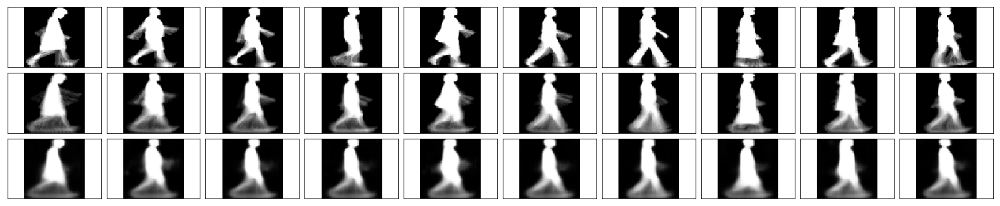

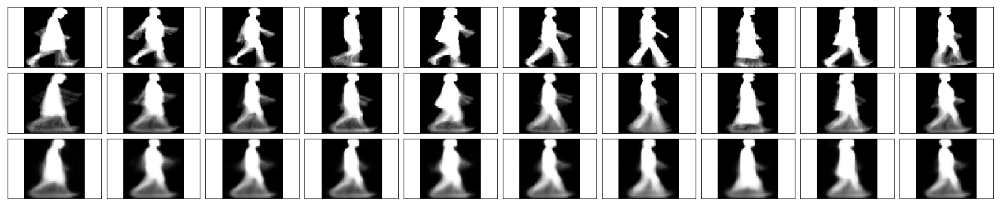

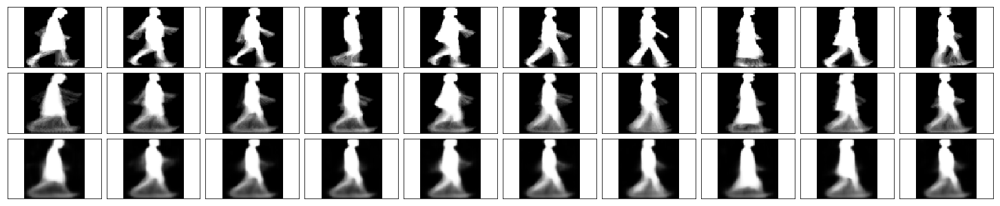

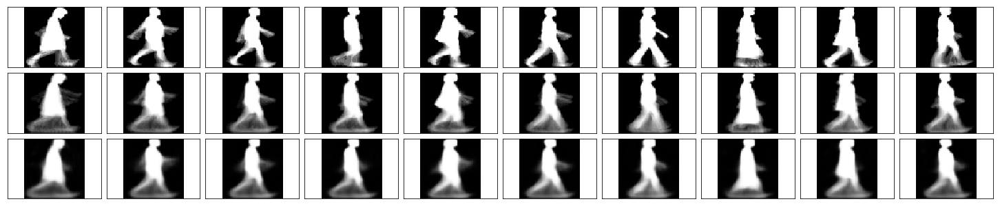

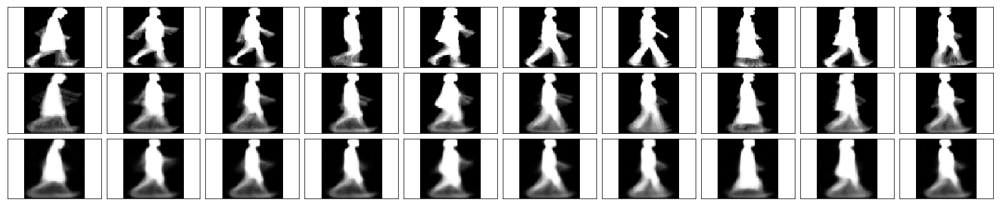

...

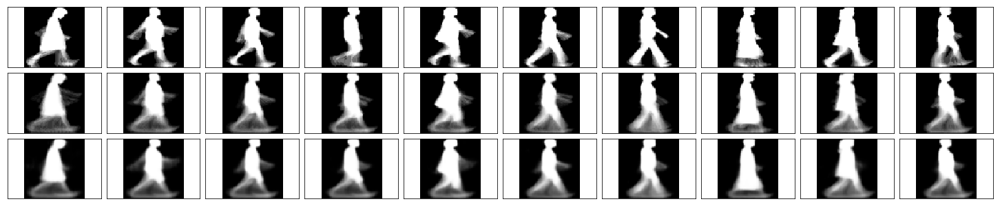

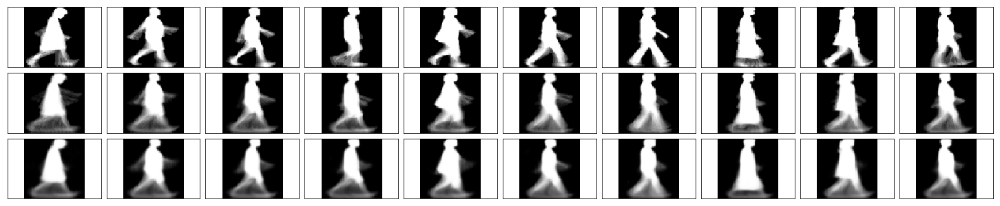

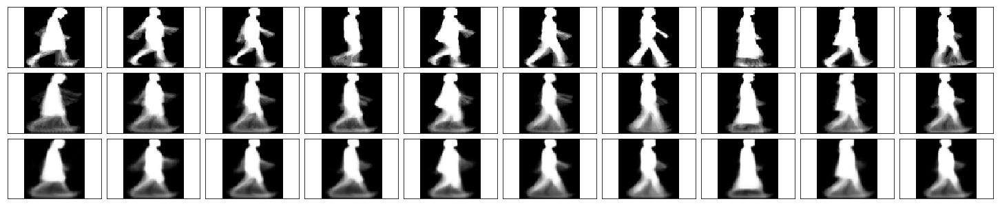

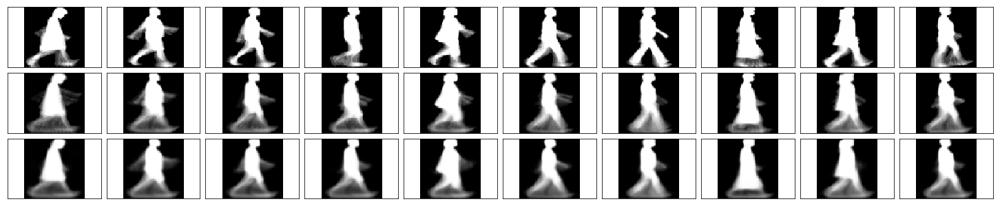

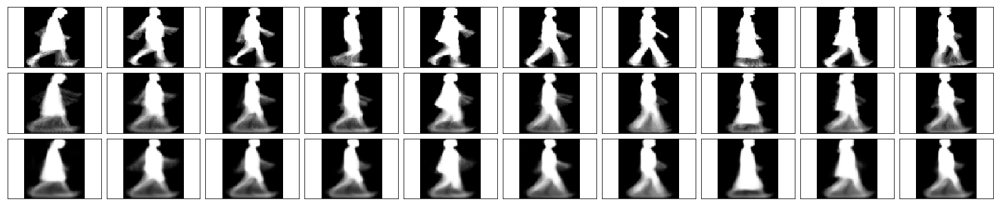

In [21]:
epochs = 3000
num_layers = 3
batch_size = 80

for lr in [0.0008]:
    save_string = './checkpoints_view_invariant/5f-full_add_more_data_E2E_lr={}_bs={}_nl={}.ckpt'.format(lr, batch_size, num_layers)
    with tf.Session(config=tf.ConfigProto(log_device_placement=True), graph=g) as sess:
        sess.run(tf.global_variables_initializer())

        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        mean_val_mse = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0


        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):

                start = time.time()

                feed_1 = {
                            inputs: train_batch, 
                            targets: target_batch,
                            keep_p: 0.5,
                            learning_rate: lr,
                            training:True
                        }

                train_loss, _, decoded_img = sess.run([cost, opt, decoded], feed_dict=feed_1)

                train_acc = cal_accuracy(decoded_img, target_batch)

                if iteration%25==0:
                    end = time.time()
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                              "Iteration: {},".format(iteration),' '
                              "Train loss: {:.3f},".format(train_loss),'      '
                              "{:.1f}s /batch.".format((end-start)/5),' '
                              "Train Accuracy: %{:.3f}".format(train_acc))

                    ##############################################################
                    ######################## VALIDATION ##########################
                    ##############################################################

                if iteration%35==0:
                    validation_loss = []
                    validation_acc = []
                    validation_mse = []
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size


                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
                        feed_2 = {
                                    inputs: val_batch,
                                    targets: val_target_batch,
                                    keep_p: 1,
                                    training:True
                                }

                        val_loss, val_mse, val_decoded_img = sess.run([cost, MSE, decoded], feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
    
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                        validation_mse.append(val_mse)

                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    mean_val_mse = np.mean(np.array(validation_mse))

                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation MSE: {:.5f},".format(mean_val_mse),' '
                              "Validation accuracy: {:.3f},".format(mean_val_acc))
                    print()
                ####### plot #######
                if iteration%500==0:

                    feed_3 = {
                                inputs: val_x[:10],
                                keep_p: 1,
                                training:True
                                }

                    fig, axes = plt.subplots(nrows=3, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_x[:10]
                    reconstructed = sess.run(decoded, feed_dict=feed_3)
                    target_imgs = val_y[:10]
                    
                    # plot out
                    for images, row in zip([in_imgs, target_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)

                iteration += 1

                # Early stopping  
                if mean_val_acc > 91.3:
                    break
    #             if mean_val_Acc - Last_val_Acc <= -0.3:
    #                 count_Acc_not_increase_epochs += 1
    #             if Last_val_loss - mean_val_loss <= -0.01:
    #                 count_loss_not_decrease_epochs += 1

    #             if mean_val_Acc - Last_val_Acc <= -2:
    #                 break
    #             if count_Acc_not_increase_epochs >= 10:
    #                 break
    #             if count_loss_not_decrease_epochs >= 10:
    #                 break

        saver.save(sess, r"{}".format(save_string))
        
print(' ')
print(' ')
print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
print(' ')
print(' ')

In [1]:
0.0026*255

0.6629999999999999

val_x (646, 64, 64, 1) val_y (646, 64, 64, 1)


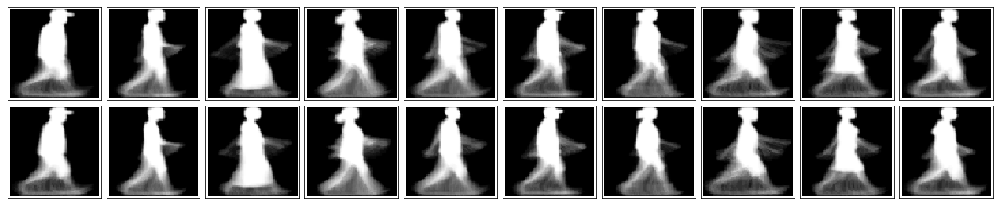

In [17]:
# Val X
val_x = gallery_full[2500:, 2]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2500:, 3]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = val_x[:10]
# reconstructed = sess.run(decoded, feed_dict=feed_3)
target_imgs = val_y[:10]
                    
# plot out
for images, row in zip([in_imgs, target_imgs], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)


# Test Model: 5f-full_add_more_data_E2E_lr=0.0008_bs=80_nl=3.ckpt

In [35]:
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))

gallery_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq00', mode='rb'))
probe_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq01', mode='rb'))

gallery_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq00', mode='rb'))
probe_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq01', mode='rb'))

gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)
gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)

gallery_5f_2 = gallery_5f_2/float(255)
probe_5f_2 = probe_5f_2/float(255)

gallery_5f_3 = gallery_5f_3/float(255)
probe_5f_3 = probe_5f_3/float(255)

In [36]:
# Val X
val_x = np.concatenate([gallery_5f[2146:2646, 3], probe_5f[2146:2646, 3], gallery_5f_2[2146:2646, 3], 
                        probe_5f_2[2146:2646, 3], gallery_5f_3[2146:2646, 3], probe_5f_3[2146:2646, 3]], axis=0)
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = np.concatenate([gallery_full[2146:2646, 3], probe_full[2146:2646, 3], gallery_full[2146:2646, 3], 
                        probe_full[2146:2646, 3], gallery_full[2146:2646, 3], probe_full[2146:2646, 3]], axis=0)
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = np.concatenate([gallery_5f[2646:, 3], probe_5f[2646:, 3], gallery_5f_2[2646:, 3], 
                         probe_5f_2[2646:, 3], gallery_5f_3[2646:, 3],probe_5f_3[2646:, 3]], axis=0)
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = np.concatenate([gallery_full[2646:, 3], probe_full[2646:, 3], gallery_full[2646:, 3], 
                         probe_full[2646:, 3], gallery_full[2646:, 3], probe_full[2646:, 3]], axis=0)
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

val_x (3000, 64, 64, 1) val_y (3000, 64, 64, 1)
test_x (3000, 64, 64, 1) test_y (3000, 64, 64, 1)


In [37]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

def save_decoded(decoded_batch, save_path, batch_number):
    reshape = np.reshape(decoded_batch, [decoded_batch.shape[0], decoded_batch.shape[1], decoded_batch.shape[2]])
    for ii, image in enumerate(reshape):
        imsave('{}/{}.png'.format(save_path, ii + batch_number*50 + 1), image)

In [44]:
New_folder_path = './OULP-C1V2_Pack/OULP-GEI-(64x64)-5f-full_add_more_data_model/decoded_gallery_5f-full'
# os.makedirs(New_folder_path)

test_batch_size = 50
loaded_graph = tf.Graph()
save_model_path = './checkpoints_view_invariant/5f-full_add_more_data_E2E_lr=0.0008_bs=80_nl=3.ckpt'
with tf.Session(graph=loaded_graph) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    test_inputs = loaded_graph.get_tensor_by_name('inputs:0')
    test_targets = loaded_graph.get_tensor_by_name('targets:0')
    test_training = loaded_graph.get_tensor_by_name('training:0')
    test_keep_p = loaded_graph.get_tensor_by_name('keep_prob:0')
    
    test_decoded = loaded_graph.get_tensor_by_name('output_layer/output:0')
    test_MSE= loaded_graph.get_tensor_by_name('MSE:0')
    
    test_mse = []
    test_acc = []
    mean_test_mse = 0
    mean_test_acc = 0
    
    for ii, (test_batch, test_target_batch) in enumerate(get_batches(
                                     np.concatenate([val_x[2500:3000], test_x[2500:3000]], axis=0), 
                                     np.concatenate([val_y[2500:3000], test_y[2500:3000]], axis=0), test_batch_size)):
        feed_dict = {test_inputs: test_batch,
                     test_targets: test_target_batch,
                     test_training: 1,
                     test_training:True
                    }
        
        test_mean_squared_error, test_decoded_img = sess.run([test_MSE, test_decoded], feed_dict=feed_dict)
#         save_decoded(test_decoded_img, New_folder_path, ii)
        
        test_ACC = cal_accuracy(test_decoded_img, test_target_batch)
        
        test_mse.append(test_mean_squared_error)
        test_acc.append(test_ACC)
    
    mean_test_mse = np.mean(np.array(test_mse))
    mean_test_acc = np.mean(np.array(test_acc))
    
    print('mean_test_mse: {:.4f}'.format(mean_test_mse*255.0*255.0))
    print('mean_test_acc: {:.4f}'.format(mean_test_acc))

INFO:tensorflow:Restoring parameters from ./checkpoints_view_invariant/5f-full_add_more_data_E2E_lr=0.0008_bs=80_nl=3.ckpt
mean_test_mse: 183.0021
mean_test_acc: 90.2960
